In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import random
import phate

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm

from External.ICT.calculate_ICT import calculate_ICT
from External.clustering import centers, k_means_pp, ICT_clusters, cfilter, cassign
from External.generation import create_graph, find_backbone
from External.plotting import plot_points, plot_graph, no_intersections
from External.reweight import reweight_clusters
from External.data_loader import data_loader

from copy import deepcopy

# from External.create_k_nearest import patch_together

plt.style.use('standard.mplstyle')

In [5]:
# Hyperparameters
mode = "K_Nearest" # Graph construction mode
ICT_algorithm = "cluster_all"
metric = "euclidean" # metric for clustering

# Cluster rassignment
min_cluster_size = 12

In [6]:
position, labels, embedding = data_loader("eth_CC", True)
dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding", False)

number_of_nodes = len(position)

# calculate the clusters
pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))

Final k: 11
sklearn is done: 125.36162757873535
My own part is done: 20.263917207717896
sklearn is done: 511.5873107910156
My own part is done: 115.99855661392212


create edgeId array:   0%|          | 0/149792 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149792 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

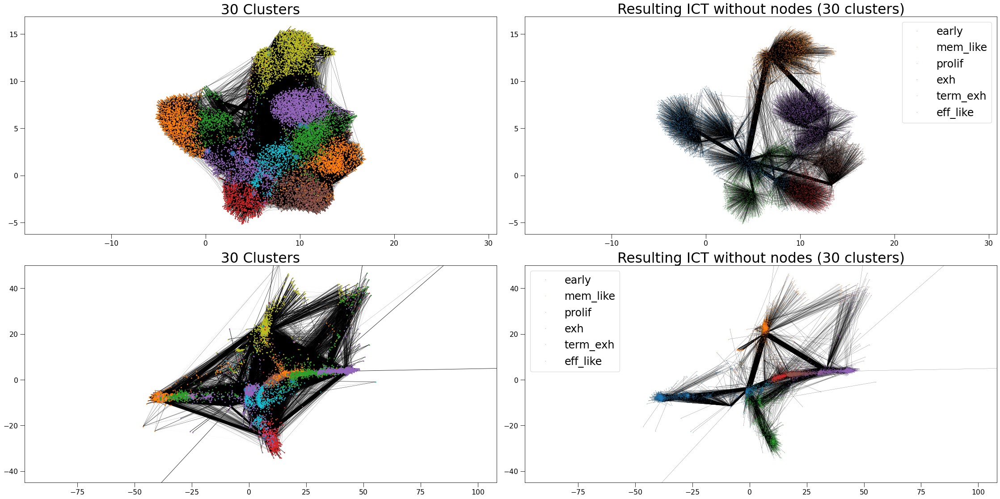

sklearn is done: 271.4386782646179
My own part is done: 65.70457434654236
sklearn is done: 535.633665561676
My own part is done: 119.16183066368103


create edgeId array:   0%|          | 0/149792 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149792 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

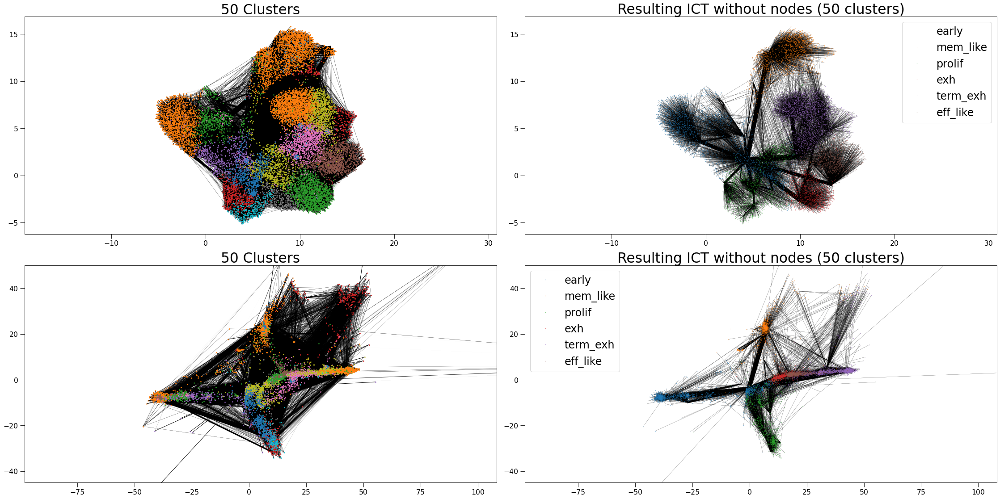

sklearn is done: 293.6608934402466
My own part is done: 77.67938876152039
sklearn is done: 519.5212802886963
My own part is done: 116.20490884780884


create edgeId array:   0%|          | 0/149792 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149792 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

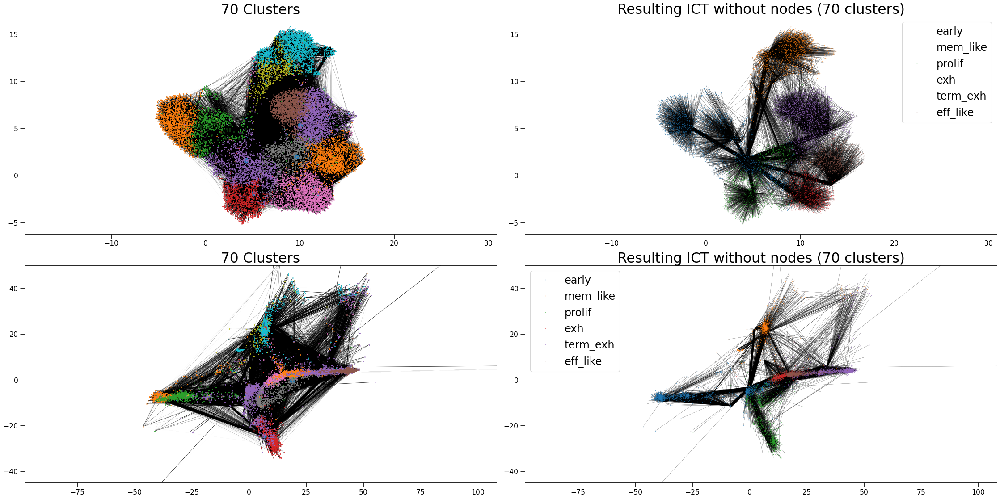

sklearn is done: 268.1390507221222
My own part is done: 64.62135314941406
sklearn is done: 371.2410776615143
My own part is done: 94.54099988937378


create edgeId array:   0%|          | 0/149792 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149792 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

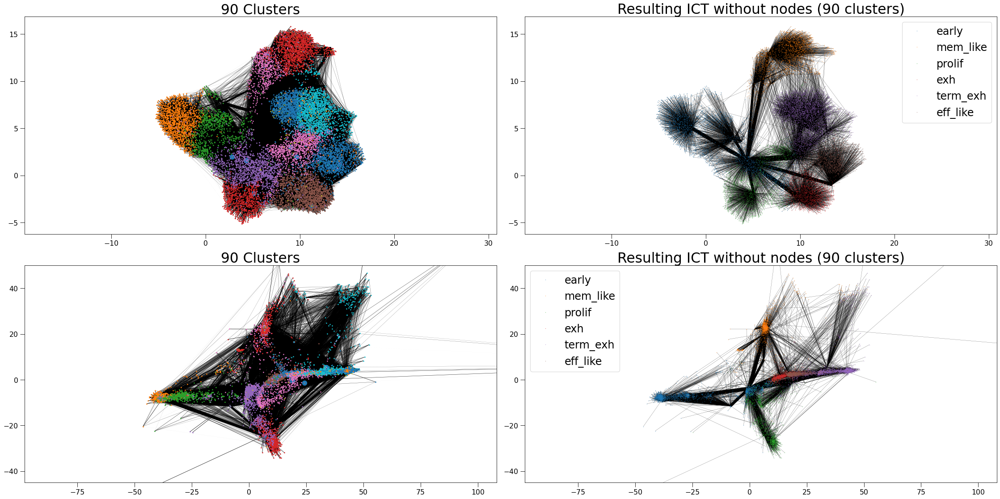

sklearn is done: 198.098548412323
My own part is done: 59.160277128219604
sklearn is done: 262.2864806652069
My own part is done: 71.06795620918274


create edgeId array:   0%|          | 0/149792 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149792 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

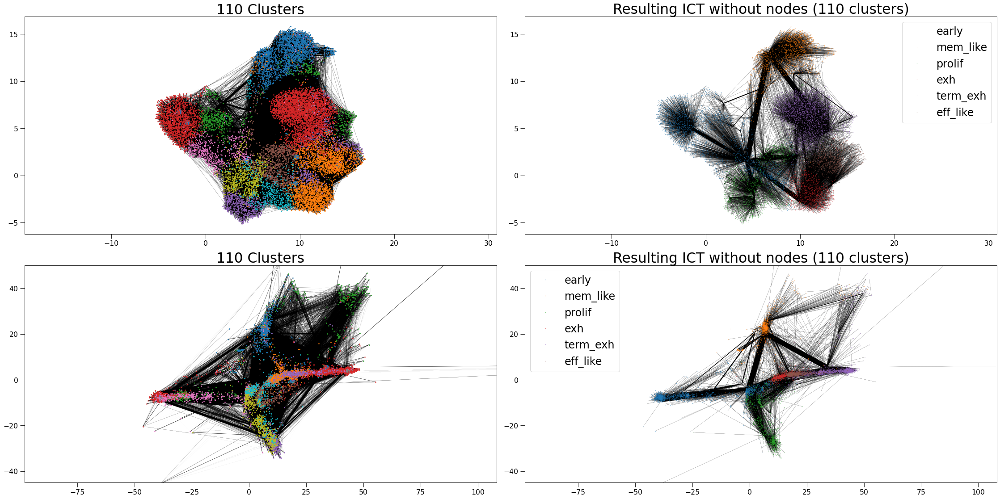

sklearn is done: 283.2840769290924
My own part is done: 79.62166452407837
sklearn is done: 265.926775932312
My own part is done: 71.42276787757874


create edgeId array:   0%|          | 0/149792 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149792 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

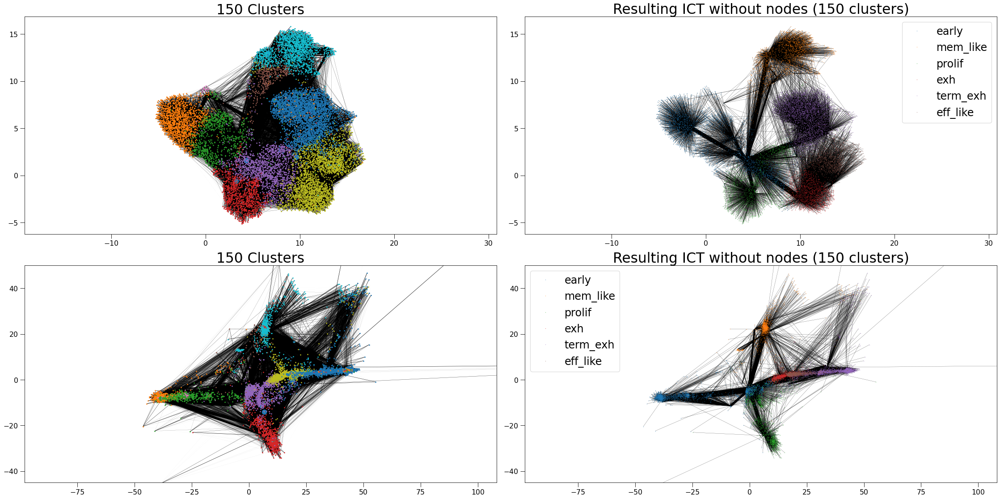

sklearn is done: 355.25059962272644
My own part is done: 106.01653504371643
sklearn is done: 266.20358991622925
My own part is done: 71.4402174949646


create edgeId array:   0%|          | 0/149792 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149792 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

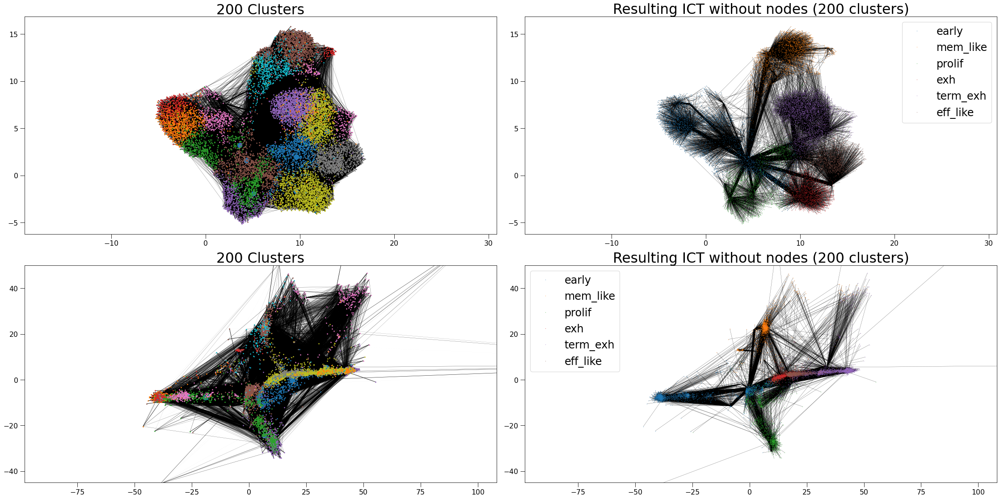

In [7]:
old_G, _ = create_graph(number_of_nodes, mode, position=position, beta=2, delta=0.5)

for k in [30, 50, 70, 90, 110, 150, 200]:
    
    G = deepcopy(old_G)
    cluster_centers, cluster_labels = k_means_pp(k, position, metric=metric, return_labels=True)

    cluster_centers, cluster_labels = cassign(cluster_centers, cluster_labels, position, t=min_cluster_size)

    G = reweight_clusters(position, G, cluster_centers, cluster_labels, min_scale = 0.3, max_scale=1.1)
    
    G.indexEdges()
    
    cluster_centers2 = centers(position)
    
    ICT = calculate_ICT(G, algorithm_type=ICT_algorithm, cluster_centers=cluster_centers2, zeros_stay_zeros=True, update_G=1.1)
        
    ICT.indexEdges()
    
    # Plot the ICT
    fig, axs = plt.subplots(2, 2)
    
    plot_graph(G, embedding, f"", axs[0,0], node_size=0)
    plot_points(embedding[cluster_centers], f"", axs[0,0], node_size=20)
    plot_points(embedding, f"{k} Clusters", axs[0,0], labels=np.array(cluster_labels), node_size=3)
    axs[0,0].get_legend().remove()
    
    
    plot_points(embedding, f"", axs[0,1], labels=labels, node_size=0.5)
    plot_graph(ICT, embedding, f"Resulting ICT without nodes ({k} clusters)", axs[0,1], node_size=0)
    name = str(k)

    
    plot_graph(G, dtae_embedding, f"", axs[1,0], node_size=0)
    plot_points(dtae_embedding[cluster_centers], f"", axs[1,0], node_size=20)
    plot_points(dtae_embedding, f"{k} Clusters", axs[1,0], labels=np.array(cluster_labels), node_size=3)
    axs[1,0].get_legend().remove()
    
    
    plot_points(dtae_embedding, f"", axs[1,1], labels=dtae_labels, node_size=0.5)
    plot_graph(ICT, dtae_embedding, f"Resulting ICT without nodes ({k} clusters)", axs[1,1], node_size=0)
    name = str(k)
    
    axs[1,0].set_xlim([-50,60])
    axs[1,0].set_ylim([-45,50])
    axs[1,1].set_xlim([-50,60])
    axs[1,1].set_ylim([-45,50])
    
    
    plt.tight_layout()
    plt.savefig(f"Output/ETH/real/" + name.zfill(5) + ".png")
    plt.show()